# Cell Arrangement Workflow (CAW)
This workflow was developed to provide more complex data analysis to the table outputted by the GE Research Use Only system. The workflow walks the user through a number of data processing stages through the use of Jupyter Notebook that is included in the Anaconda 3 Python Environment. These data processing stages include:

__1)	Initiate Python Packages__ – The user will initiate and load relevant Python packages into the Jupyter Notebook.

__2)	Input Session Information__ – The user will identify them along with relevant information pertaining to the data analysis session.

__3)	Assign and Load the Files__ – The user will adjust the inputs of the code to the appropriate files and folders that are to be used.

__4)	Select the Biomarkers, the Slide and Regions, and if to include Cell if found in Stroma/Epithelial mask__ – The user will select, from the available biomarkers mentioned in the GE file, which ones will be included in the analysis. They will also select the slides that will be included along with the specific regions in each cell. The user will also have an opportunity here to specify if they want to include only cells found in the Stroma/Epithelial mask.

__5)	Cell Quality Control Parameters__ – The user will identify acceptable the criteria that a cell needs to pass to be included in the final analysis. This section includes criteria such as the slide and region for which the cell is located, the minimum GE quality score acceptable, and the identity of the cell as a stroma or epithelial cell, and various morphological features.

__6)	Cell Biomarker Expression Data Settings__ – The user will define what biomarker intensities data transformations need to be and define the appropriate data processing procedure; thresholding, K-means clustering, or continuous variables.

__7)	Data Processing__ – The user will initiate the data processing based on the settings selected in the earlier stages.

__8)	Data Visualization__ – The results of the data processing are dynamically displayed to the user.


In [4]:
from IPython.display import display, Markdown, Javascript
from ipywidgets import widgets
import WidgetFunctionsDimaEdit as WidgFunc

display(Markdown('## Running Through Jupyter Notebook'))


display(Markdown('To run a cell, click on the cell such that it is highlighted:'))

file = open("ScreenCaptureIms\SelectCell.png", "rb")
selimg = file.read()
selimgwid = widgets.Image(value=selimg,
                            format='png')
display(selimgwid)
 
display(Markdown('To execute the cell either press and hold the __Ctrl + Enter__ or __Shift + Enter__ keys together, or press the _"run cell, select below"_ button:'))

file = open("ScreenCaptureIms\RunCell.png", "rb")
selimg = file.read()
runimgwid = widgets.Image(value=selimg,
                            format='png')
display(runimgwid)
 

display(Markdown('# 1) Initiate Python Packages'))
display(Markdown('Python Packages are the coding libraries that provide the computational tools used in this workflow. This might take some time to fully load. Please select and run the next cell.'))

display(Markdown('When all of the packages are properly imported, the following message will appear:'))

display(Markdown('<h2><center>All Python packages have been imported.</center></h2>'))

display(Markdown('It is also important to note that there may be some warning box that will precede the "_All Python packages have been imported._" message. Please ignore them. They are of no consequence to the running of the workflow.'))

display(Markdown('This cell will also setup the dictionary of user settings that will track all of the user defined parameters.'))


# Run next code Cell
display(Javascript('IPython.notebook.execute_cell_range(IPython.notebook.get_selected_index(), IPython.notebook.get_selected_index()+1)'))

## Running Through Jupyter Notebook

To run a cell, click on the cell such that it is highlighted:

A Jupyter Widget

To execute the cell either press and hold the __Ctrl + Enter__ or __Shift + Enter__ keys together, or press the _"run cell, select below"_ button:

A Jupyter Widget

# 1) Initiate Python Packages

Python Packages are the coding libraries that provide the computational tools used in this workflow. This might take some time to fully load. Please select and run the next cell.

When all of the packages are properly imported, the following message will appear:

<h2><center>All Python packages have been imported.</center></h2>

It is also important to note that there may be some warning box that will precede the "_All Python packages have been imported._" message. Please ignore them. They are of no consequence to the running of the workflow.

This cell will also setup the dictionary of user settings that will track all of the user defined parameters.

<IPython.core.display.Javascript object>

In [5]:
# Packages:
# Data Organization and Processing:
import pandas as pd
# remove the warning for indexing that is really annoying with pandas
pd.set_option('mode.chained_assignment', None)
import numpy as np
import re
from collections import OrderedDict

# Machine Learning
from sklearn.cluster import KMeans, DBSCAN
from sklearn import metrics

# Custom-Built Supporting Functions
import GEFileFunctions
import WidgetFunctionsDimaEdit_working as WidgFunc
import ConcatFunctions_VHE_20180913 as Conc
#import ConcatFunctions4

# Settings:
# Display up to 50 columns
pd.set_option('display.max_columns', 50)
import os
import datetime

# Display Modules
from IPython.display import Latex, clear_output, Javascript
from ipywidgets import interact, fixed, widgets, Layout, interactive
from IPython.display import HTML
import traitlets
from tkinter import Tk, filedialog

# Visualization:
import matplotlib.pyplot as plt
import matplotlib.colors as pltcol
import cv2

import plotly.offline as py
from plotly.offline import enable_mpl_offline, iplot_mpl
py.init_notebook_mode(connected = True)
enable_mpl_offline()

import plotly.graph_objs as go
from plotly.widgets import GraphWidget
import colorlover as cl

# Building Settings Dictionary
QualSettingsDict = OrderedDict({
    'SessionInfo':{
        'User':[],
        'Date':[],
        'ProjectName':[],
        'UserProjNotes':[],
    },
    'FileInfo':{
        'GEFileName': [],
        'DAPIimFileName': [],
        'OutDataFolder':[],
    },
    'ProcessingSettings':{'BMs':{},
        'slide_regs_original': [],
        'epithelial': [],
        
    },
    'CellAcceptRanges':{
        'Perimeter': [],
        'Eccentricity': [],
        'MajorAxisLength': [],
        'Nuc_Area': [],
        'Cyt_Area': [],
        'Memb_Area': [],
        'Cell_Area': [],
    }
})


# Display Python Package Importing Complete message
display(Markdown('## All Python packages have been imported.'))

WidgFunc.SimpleClickProceedSettings()


#--- Calling Toggle ----
# Hide or display code button definition
HideShowCodeButton = HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click to toggle on/off raw code"></form>''')

# Display Hide or display code button
HideShowCodeButton

## All Python packages have been imported.

A Jupyter Widget

<IPython.core.display.Javascript object>

In [6]:
display(Markdown('# 2) Input Session Information'))
display(Markdown('The following cell will produce a quick digital form to fill out such that the project information can be saved together.'))
display(Markdown('At the end of the form, a "Lock Settings" button will appear. Please click it to ensure that all of the inputs are properly saved. '))

# Run next code Cell
WidgFunc.SimpleClickProceedSettings()

# 2) Input Session Information

The following cell will produce a quick digital form to fill out such that the project information can be saved together.

At the end of the form, a "Lock Settings" button will appear. Please click it to ensure that all of the inputs are properly saved. 

A Jupyter Widget

<IPython.core.display.Javascript object>

In [7]:
#declare global variables here to communicate with function library properly
global SessionDate
global User
global ProjectName
global ProjectNotes

SessionDate = widgets.DatePicker(
    value = datetime.date.today(),
    description = 'Date of analysis session:',
    style = {'description_width':'initial'},
)

User = widgets.Text(
    description = 'User:',
    style = {'description_width':'initial'}
)

############global ProjectName

ProjectName = widgets.Text(
    description = 'Project Name:',
    style = {'description_width':'initial'}
)

ProjectNotes = widgets.Textarea(
    description = 'Project Notes:',
    style = {'description_width':'initial'}
)

display(Markdown('#### Please fill in the following information:'))
display(User)
display(SessionDate)
display(ProjectName)
display(ProjectNotes)



#----- Lock Settings Toggle ------------
global NumberLocked1
global ProjNameErr_bool
NumberLocked1 = 0
ProjNameErr_bool = False


#----- Error Message Widget ------------
# this is a really ridiculous hack to be able to open and close error messages at will
# I couldn't figure out the display text widgets so I created an empty progress bar that never fills
# and I just open and close the text/progress bar title at will. Very hacky solution.... :(
def INITProjNameErr():
    global ProjNameErr
    ProjNameErr = widgets.FloatProgress(
                description='<font color=red size=3>Name Error: Please Input Project Name.</font>',
                bar_style='info',
                orientation='horizontal',
                style = {'description_width':'initial'}
                )


# Function to save User Inputs everytime Lock Settings is Clicked
def ExecuteOnLock():
    if (ProjectName.value != ''):
        QualSettingsDict['SessionInfo']['Date'] = SessionDate.value
        QualSettingsDict['SessionInfo']['ProjectName'] = ProjectName.value
        QualSettingsDict['SessionInfo']['User'] = User.value
        QualSettingsDict['SessionInfo']['UserProjNotes'] = ProjectNotes.value
        # Run next cell if not run yet - stop it from re-running cell below
        global NumberLocked1
        if NumberLocked1 ==0:
            # Run next code cell
            display(Javascript('IPython.notebook.execute_cell_range(IPython.notebook.get_selected_index()+1, IPython.notebook.get_selected_index()+2)'))
        NumberLocked1 = NumberLocked1 + 1
    if (ProjectName.value == ''):
        INITProjNameErr()
        display(ProjNameErr)
        global ProjNameErr_bool
        ProjNameErr_bool = True

# Close error message on unlock to clear panel
def ExecuteOnUnlock():
    if ProjNameErr_bool is True:
        ProjNameErr.close()
    return None


#--- Calling Toggle ----
WidgetList = [User, SessionDate, ProjectName, ProjectNotes]
WidgFunc.SimpleToggleLockSettings(WidgetList, ExecuteOnLock, ExecuteOnUnlock)

#### Please fill in the following information:

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

<IPython.core.display.Javascript object>

In [8]:
display(Markdown('# 3) Assign and Load the Files'))
display(Markdown('Please run the cell below and select the following:')) 
display(Markdown('* GE table to be processed'))
display(Markdown('* GE file\'s corresponding DAPI image (for visualization purposes)'))
display(Markdown('* a folder that you would like all the output material sent to'))

# Run next code Cell
WidgFunc.SimpleClickProceedSettings()

# 3) Assign and Load the Files

Please run the cell below and select the following:

* GE table to be processed

* GE file's corresponding DAPI image (for visualization purposes)

* a folder that you would like all the output material sent to

A Jupyter Widget

<IPython.core.display.Javascript object>

In [9]:
# Get the GE file from user
GEfile = WidgFunc.SelectFilesButton()
# Get the DAPI image from user
DAPIfile = WidgFunc.SelectOneFileButton()
# Get the output folder from user
OutputFold = WidgFunc.SelectFolderButton()
# Get the output file format from user
OutputFileFormat = widgets.RadioButtons(options=['.csv', '.xlsx'],
                                        value='.csv',
                                        description='Output file format:',
                                        style = {'description_width':'initial'},
                                        disabled=False
                                        )

#-------- Displaying widgets and instructions --------
display(widgets.Label('Please select the GE file(s) that contain the table(s) to be analysed:'))
display(GEfile)
display(widgets.Label('Please select the desired output file format (note: .xlsx will take longer to run than .csv):'))
display(OutputFileFormat)
display(widgets.Label('Please select the DAPI image file for visualization purposes:'))
display(DAPIfile)
display(widgets.Label('Please select the output folder, where all results will be saved:'))
display(OutputFold)

#------- Lock Settings toggle --------
global NumberLocked2a
global INITFileUploadErr_bool
global INITFoldUploadErr_bool
INITFileUploadErr_bool = False
NumberLocked2a = 0
INITFoldUploadErr_bool = False

def INITFileUploadErr():
    global FileUploadErr
    FileUploadErr = widgets.FloatProgress(
                description='<font color=red size=3>File Error: Please upload all files.</font>',
                bar_style='info',
                orientation='horizontal',
                style = {'description_width':'initial'})

def INITFoldUploadErr():
    global FoldUploadErr
    FoldUploadErr = widgets.FloatProgress(
                description='<font color=red size=3>Error: Please select an output folder.</font>',
                bar_style='info',
                orientation='horizontal',
                style = {'description_width':'initial'})    

def ExecuteOnLock():
    try:
        OutputFold.fold != []
    except AttributeError:
        INITFoldUploadErr()
        display(FoldUploadErr)
        global FoldUploadErr_bool
        FoldUploadErr_bool = True
        return

    if (GEfile.files != []) & (DAPIfile.files != []):
        # Run next cell if not run yet - stop it from re-running cell below
        global NumberLocked2a
        if NumberLocked2a == 0:
            # Run next code cell
            display(Javascript('IPython.notebook.execute_cell_range(IPython.notebook.get_selected_index()+1, IPython.notebook.get_selected_index()+2)'))
        NumberLocked2a = NumberLocked2a + 1

    if (DAPIfile.files == []) or (GEfile.files == []) or (OutputFold.fold == []):
        INITFileUploadErr()
        display(FileUploadErr)
        global FileUploadErr_bool
        FileUploadErr_bool = True

def ExecuteOnUnlock():
    try:
        if FoldUploadErr_bool is True:
            FoldUploadErr.close()
        if FileUploadErr_bool is True:
            FileUploadErr.close()
    except NameError:
        return
    return None

# Saving settings in dictionary:
WidgetList = [GEfile, OutputFileFormat, DAPIfile, OutputFold]
WidgFunc.SimpleToggleLockSettings(WidgetList, ExecuteOnLock, ExecuteOnUnlock)

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

<IPython.core.display.Javascript object>

In [10]:
#------- Defined ExportOnClick() Button --------
# implement this in the widgets function library
class ExportOnClick(widgets.Button):
    """A file widget that concatenates the input files into one output with some file name
    that may either be initialized by the user or is autogenerated"""

    def __init__(self, *args, **kwargs):
        """Initialize the ExportOnClick class."""
        super().__init__(*args, **kwargs)
        # Add the selected_files trait
        self.add_traits(files=traitlets.traitlets.List())
        # Create the button.
        self.description = "Click to Export"   # RE-NAMNG THIS TO ALLOW US TO APPLY IT FOR MORE 
        self.icon = ""                         # CASES THAN JUST CONCATENATING FILES EXCLUSIVELY
        self.style.button_color = "lightblue" 
        # Set on click behavior.
        self.on_click(self.ClickedOutput)

    @staticmethod
    def ClickedOutput(CoC):
        """Generate instance of tkinter.filedialog.
        Parameters
        ----------
        CoC (concatenate on click): obj:
            An instance of ipywidgets.widgets.Button
        """
        
        
        Conc.ConcatIfMatch(User.value, SessionDate.value, ProjectNotes.value, ProjectName.value, GEfile, OutputFold.fold[0], OutputFileFormat.value)
        CoC.files = GEfile.files

        if CoC.files[0]!= '':
            CoC.description = "Export Success"
            CoC.icon = "check"
            CoC.style.button_color = "lightgreen"


#--------
# initialize this to zero so that concat is only appended to WidgetList when true, not always
# note: we're doing this bc we want ConcatButton to append as the 4th element, not the first
AppendConcat = 0
emptyfiles = False

try:
    if len(GEfile.files) > 0:
        # Allow user to concatenate files
        ConcatButton = ExportOnClick()
        display(widgets.Label('Please click to merge and export input files to proceed.'))
        display(ConcatButton)
        AppendConcat = 1
        
        if ProjectName.value:
            OutputName = ProjectName.value
        elif not ProjectName.value:
            try:
                OutputName = Conc.InNameConcatReturn()  #returns InNameConcat
                progressbarCONCAT.close()

            except NameError:
                pass    # we're doing this to bypass the NameError that pops up when the program tries to run 
                        # InNameConcatReturn() prior to running ConcatIfMatch(). (ConcatIfMatch runs the for loop
                        # that assigns a value to the variable InNameConcat). This can potentially also be fixed via 
                        # seperating the naming for loop from the rest of the for loop but then we're going though
                        # the same for loop twice which is a smidge less efficient (though altogether doesn't make a
                        # difference at all in the grand scheme of things, but is considered good practise, I guess.)
        else:
            print("Some other output name generating error occurred: check function ReadMatchName()")
        
    #elif len(GEfile.files) == 1:
    #    print("Only 1 file uploaded: no concat required.")
    #    COMMENTING THIS OUT AND REWRITING ABOVE IF TO INCLUDE len == 1 TO 
    #    ENSURE EXPORTING RUNS FOR len == 1 AS WELL.
        
    elif len(GEfile.files) == 0:
        print("No files uploaded.")
        emptyfiles = True
        
    else: # shouldn't ever really run...
        print("Some error occurred.")
        
except ValueError:
    print("Some other error occurred.")

    
#----------- Toggle lock settings ------------
# Function to save User Inputs every time Lock Settings is Clicked
NumberLocked2 = 0

def ExecuteOnLock():
    if emptyfiles == True:
        display(Markdown('## <font color=red>Upload Error: Please ensure you\'ve uploaded all necessary files and folders.</font>'))
        return
    if (GEfile.files != []) & (GEfile.files[0] != ''):
        # Saving settings in dictionary:
        QualSettingsDict['FileInfo']['GEFileName'] = GEfile.files[0]
        QualSettingsDict['FileInfo']['DAPIimFileName'] = DAPIfile.files[0]
        QualSettingsDict['FileInfo']['OutDataFolder'] = OutputFold.fold[0]

        # reading data table and displaying
        global GEdf, BMsAvail
        GEdf = pd.read_table(QualSettingsDict['FileInfo']['GEFileName'])

        BMsAvail = GEFileFunctions.BiomarkerNames(GEdf)

        display(Markdown('## Biomarkers Measured:'))
        BMstring = ''
        for BM in BMsAvail:
            BMstring = BMstring + '__'+ BM + '__ | '
        display(Markdown(BMstring))

        display(Markdown('## GE File:'))
        display(GEdf)

        # Defining defaults

        # Slide-region pairings
        slide_reg = []
        for slide in list(set(GEdf['slide'])):
            regs = list(set(GEdf.loc[GEdf['slide']==slide]['region']))
            slide_reg.append([slide,regs])

        QualSettingsDict['ProcessingSettings']['slide_regs_original'] = slide_reg
        QualSettingsDict['ProcessingSettings']['slide_regs_selected'] = slide_reg



        # Epithelial or Stroma - converting to int
        if 'epithelial' in list(GEdf.columns):
            QualSettingsDict['ProcessingSettings']['epithelial'] = list(map(int,list(set(GEdf['epithelial']))))

        if 'stroma' in list(GEdf.columns):
            QualSettingsDict['ProcessingSettings']['stroma'] = list(map(int,list(set(GEdf['stroma']))))

        # qc_score - converting to int
        QualSettingsDict['CellAcceptRanges']['qc_score'] = min(GEdf['qc_score']), max(GEdf['qc_score'])
        # Perimeter
        QualSettingsDict['CellAcceptRanges']['Perimeter'] = min(GEdf['Perimeter']), max(GEdf['Perimeter'])
        # Eccentricity
        QualSettingsDict['CellAcceptRanges']['Eccentricity'] = min(GEdf['Eccentricity']), max(GEdf['Eccentricity'])
        # MajorAxisLength
        QualSettingsDict['CellAcceptRanges']['MajorAxisLength'] = min(GEdf['MajorAxisLength']), max(GEdf['MajorAxisLength'])
        # MinorAxisLength
        QualSettingsDict['CellAcceptRanges']['MinorAxisLength'] = min(GEdf['MinorAxisLength']), max(GEdf['MajorAxisLength'])
        # Perimeter
        QualSettingsDict['CellAcceptRanges']['Nuc_Area'] = min(GEdf['Nuc_Area']), max(GEdf['Nuc_Area'])
        # Perimeter
        QualSettingsDict['CellAcceptRanges']['Cyt_Area'] = min(GEdf['Cyt_Area']), max(GEdf['Cyt_Area'])
        # Perimeter
        QualSettingsDict['CellAcceptRanges']['Memb_Area'] = min(GEdf['Memb_Area']), max(GEdf['Memb_Area'])
        # Perimeter
        QualSettingsDict['CellAcceptRanges']['Cell_Area'] = min(GEdf['Cell_Area']), max(GEdf['Cell_Area'])
        # Run next cell if not run yet - stop it from re-running cell below
        global NumberLocked2
        if NumberLocked2 == 0:
            # Run next markdown cell
            display(Javascript('IPython.notebook.execute_cell_range(IPython.notebook.get_selected_index()+1, IPython.notebook.get_selected_index()+2)'))
        NumberLocked2 = NumberLocked2 + 1
        
    else:
        display(Markdown('## No GE file was properly selected. Please try to select a folder again.'))
    
def ExecuteOnUnlock():
    return None
# --- Calling Toggle ----
WidgetList = [GEfile, DAPIfile, OutputFold]
if AppendConcat == 1:
    WidgetList.append(ConcatButton) #this will hopefully append concat button as the 4th element in the list
    
WidgFunc.SimpleToggleLockSettings(WidgetList, ExecuteOnLock, ExecuteOnUnlock)

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

## Biomarkers Measured:

__CK8_18__ | __COX2__ | __ER__ | __ER_2__ | __HER2__ | __KI67__ | __NAKATPASE__ | __P16__ | __P21__ | __P53__ | __PR__ | __PR_2__ | __S6__ | __S6_2__ | 

## GE File:

,CellID,slide,region,epithelial,qc_score,Perimeter,Eccentricity,MajorAxisLength,MinorAxisLength,NominalPostion_X,NominalPosition_Y,Nuc_Area,Cyt_Area,Memb_Area,Cell_Area,CK8_18,COX2,ER,ER_2,HER2,KI67,NAKATPASE,P16,P21,P53,PR,PR_2,S6,S6_2
0,1,20171227DCIS001,spot_015,1.0,1.000000,703.0,0.621742,183.931717,144.059448,2031.0,3421.0,157.0,3438.0,1674.0,7503.0,4514.450,1851.870,1365.560,197.732,11540.50,129.505,1701.570,1701.110,544.190,335.416,671.052,286.576,1417.850,165.096
1,2,20171227DCIS001,spot_015,1.0,1.000000,668.0,0.956405,193.105164,56.395039,1713.0,1087.0,9.0,3154.0,1825.0,6947.0,3562.590,1637.720,1164.160,161.815,10162.00,26.989,2731.770,1514.050,382.211,322.898,685.446,383.420,1160.930,166.333
2,3,20171227DCIS001,spot_015,1.0,1.000000,553.0,0.944681,170.295959,55.855595,179.0,3090.0,0.0,3045.0,1696.0,5547.0,5209.620,1893.660,1321.740,260.240,11734.60,40.630,2786.890,1932.070,709.147,496.298,950.543,351.968,1945.960,198.102
3,4,20171227DCIS001,spot_015,1.0,0.803877,450.0,0.608451,101.794334,80.783127,3022.0,2636.0,4.0,2522.0,403.0,5313.0,1898.180,904.041,878.317,192.729,4126.30,55.397,659.370,1180.520,296.159,231.584,690.247,167.577,1094.710,109.030
4,5,20171227DCIS001,spot_015,1.0,1.000000,501.0,0.932142,163.594254,59.236137,2567.0,2815.0,81.0,2459.0,1144.0,5053.0,3271.970,1960.930,1626.080,234.190,12507.70,57.145,2279.480,1375.390,702.368,327.072,816.349,538.921,1320.050,159.147
5,6,20171227DCIS001,spot_015,1.0,1.000000,428.0,0.938164,133.879990,46.348129,2017.0,1957.0,0.0,2543.0,1340.0,4542.0,4039.000,2110.200,1469.840,230.004,13136.30,60.402,3681.950,1417.810,590.533,416.974,881.545,466.864,1573.770,167.527
6,7,20171227DCIS001,spot_015,1.0,0.799383,518.0,0.906761,129.967026,54.799992,598.0,80.0,0.0,2365.0,551.0,4536.0,2878.670,582.349,473.216,102.608,1512.63,16.668,797.543,2717.540,386.933,525.532,919.245,361.100,2122.050,189.521
7,8,20171227DCIS001,spot_015,0.0,1.000000,423.0,0.726600,98.157280,67.439964,2988.0,917.0,0.0,1665.0,826.0,4493.0,785.890,752.891,873.769,47.276,7132.65,3.277,1397.180,681.014,105.812,42.546,443.300,358.941,574.675,93.464
8,9,20171227DCIS001,spot_015,1.0,1.000000,384.0,0.842511,104.526741,56.306400,461.0,2077.0,0.0,1897.0,1269.0,4323.0,4429.810,1503.370,862.296,170.373,8040.64,13.561,2920.130,2106.870,384.012,338.914,748.372,449.345,1456.920,131.214
9,10,20171227DCIS001,spot_015,1.0,1.000000,386.0,0.178758,77.790970,76.537994,396.0,3258.0,100.0,2483.0,1151.0,4161.0,5151.580,1872.960,1388.600,267.520,11359.80,37.855,2894.100,1750.300,772.772,519.154,1019.150,346.527,2010.620,225.333


<IPython.core.display.Javascript object>

In [11]:
display(Markdown('# 4) Select the Biomarkers to be Analysed'))

display(Markdown('The following cell will produce a quick check list containing all of the biomarkers mentioned by the GE file.'))

display(Markdown('Please ensure that ___only___ the biomarkers that you would like to include in the analysis are selected.'))

# Run next code Cell
WidgFunc.SimpleClickProceedSettings()

# 4) Select the Biomarkers to be Analysed

The following cell will produce a quick check list containing all of the biomarkers mentioned by the GE file.

Please ensure that ___only___ the biomarkers that you would like to include in the analysis are selected.

A Jupyter Widget

<IPython.core.display.Javascript object>

In [12]:
#=================== Select Biomarkers ============================
# Making Widget Containers of check boxes per biomarker
checkboxes1 = []
checkboxes2 = []
cb_container1 = widgets.VBox()
cb_container2 = widgets.VBox()

# Divide Biomarkers into 2 lists for cleaner display
count = 1
for BM in BMsAvail:
    if count%2==0:
        checkboxes2.append(widgets.Checkbox(description = BM, value=True))
    else:
        checkboxes1.append(widgets.Checkbox(description = BM, value=True))
    count = count+1

# for loops might not be necessary (leftover from older code)
cb_container1.children=[i for i in checkboxes1]
cb_container2.children=[i for i in checkboxes2]

# Allowing both vertical boxes to be displayed side by side
cb_container = widgets.HBox([cb_container1,cb_container2])

# Display instructions and widgets
display(Markdown('#### Please select the Biomarkers to include:'))
display(cb_container)

#=========== Select Slides and Regions ===================================
# Function to disable regions if the owning slide is unselected 
# (avoid possible human error)
def SlideCheckDisable(args):
    slide = args['owner'].description
    for i, sld in enumerate(QualSettingsDict['ProcessingSettings']['slide_regs_original']):
        if slide == sld[0]:
            index = i
    # extract relevant slide container
    RelSlideCont = slideCont.children[index]
    RegsCont = RelSlideCont.children[3]
    
    # Disable region checks if user deselects slide
    if args['new'] == False:
        for i in range(len(RegsCont.children)):
            RegsCont.children[i].disabled = True
    else:
        for i in range(len(RegsCont.children)):
            RegsCont.children[i].disabled = False

# Build widgets for selecting slide
# Containers
slideCont = widgets.VBox()
regionContLayout = Layout(
    border = 'solid',
    display = 'flex',    
)

# Widgets
# Regions:
SlideWidgs = [] # save for disable and reenabled
AllSlides = []
for i,slide in enumerate(QualSettingsDict['ProcessingSettings']['slide_regs_original']):
    slideW = []
    slideW.append(widgets.Label('Slide ' + slide[0]+ ':'))
    # making checkbox of region
    slidecheck = widgets.Checkbox(
        description = slide[0],
        value = True
    )
    # attach function
    slidecheck.observe(SlideCheckDisable,'value')
    
    slideW.append(slidecheck)
    SlideWidgs.append(slidecheck)
    regionCont = widgets.HBox()
    regionW = []
    for region in QualSettingsDict['ProcessingSettings']['slide_regs_original'][i][1]:
        regionW.append(widgets.Checkbox(
            description = region,
            value = True,
        ))
    
    # add region widgets
    SlideWidgs = SlideWidgs + regionW
    
    regionCont.children = regionW
    regionCont.layout = regionContLayout
    
    slideW.append(widgets.Label('Associated Regions: '))
    slideW.append(regionCont)
    slideW.append(widgets.Label('---------------------------------------------'))
    
    FullSlideCont = widgets.VBox()
    FullSlideCont.children = slideW
    
    AllSlides.append(FullSlideCont)
    
    
slideCont.children = AllSlides

# Display instructions and widgets
display(Markdown('#### Select which slides and their regions to include in the analysis:'))
display(slideCont)

# =============== Select based on cell located in epithelial/stroma mask ============================================
# when there is evidence in the GE file that either a stroma or epithelial mask 
# was included in the original analysis, 

# function to save settings when radio buttons are clicked
def UpdateEpiStromaCells(args):
    desc = args['owner'].description
    if desc == 'Epithelial:':
        if args['new'] == 'Include All Cells':
            QualSettingsDict['ProcessingSettings']['epithelial'] = [0, 1]
        elif args['new'] == 'Only Include Epithelial Cells':
            QualSettingsDict['ProcessingSettings']['epithelial'] = [1]
            
    if desc == 'Stroma:':
        if args['new'] == 'Include All Cells':
            QualSettingsDict['ProcessingSettings']['stroma'] = [0, 1]
        elif args['new'] == 'Only Include Stroma Cells':
            QualSettingsDict['ProcessingSettings']['stroma'] = [1]

# Building widgets
EpiStromaWidgs = () # list to save widgets built during this section so that they can be added to lock/unlock button
if 'epithelial' in list(QualSettingsDict['ProcessingSettings']):
    EpiStromaRad = widgets.RadioButtons(
        options = ['Include All Cells','Only Include Cells found in Epithelial Segmentation Mask'],
        value = 'Include All Cells',
        description = 'Epithelial:'
    )
    EpiStromaRad.observe(UpdateEpiStromaCells, 'value')
    display(widgets.Label('Epithelial Cell Setting:'))
    display(EpiStromaRad)
    
    # add to widget list
    EpiStromaWidgs = EpiStromaWidgs + tuple([EpiStromaRad]) + tuple(SlideWidgs)
    

if 'stroma' in list(QualSettingsDict['ProcessingSettings']):
    EpiStromaRad = widgets.RadioButtons(
        options = ['Include All Cells','Only Include Stroma Cells'],
        value = 'Include All Cells',
        description = 'Stroma:'
    )
    EpiStromaRad.observe(UpdateEpiStromaCells)
    display(widgets.Label('Stroma Cell Setting:'))
    display(EpiStromaRad)
    # add to widget list
    EpiStromaWidgs = EpiStromaWidgs + tuple([EpiStromaRad])



#-------- on toggle -------------
global NumberLocked3
NumberLocked3 = 0

def ExecuteOnLock():
# Gather selected biomarkers and save setting
    for i in range(len(cb_container.children)):
        for c in range(len(cb_container.children[i].children)):
            cb_container.children[i].children[c].disabled = True
            if cb_container.children[i].children[c].value == True:
                QualSettingsDict['ProcessingSettings']['BMs'][cb_container.children[i].children[c].description] = {
                    'LabelMethod':[],
                    'DataTransform':[],
                }
    # Gather which slides and regions to include in analysis
    QualSettingsDict['ProcessingSettings']['slide_regs_selected'] = []
    slide_regs = []
    for i in range(len(slideCont.children)):
        slideCont.children[i].children[1].disabled = True
        regsfinal = []
        for j in range(len(slideCont.children[i].children[3].children)):
            slideCont.children[i].children[3].children[j].disabled = True
            if slideCont.children[i].children[3].children[j].value == True:
                regsfinal.append(slideCont.children[i].children[3].children[j].description)

        if slideCont.children[i].children[1].value == True:
            slidefinal = slideCont.children[i].children[1].description
            QualSettingsDict['ProcessingSettings']['slide_regs_selected'].append([slidefinal, regsfinal])

    # Run next cell if not run yet - stop it from re-running cell below
    global NumberLocked3
    if NumberLocked3 ==0:
        # Run next markdown cell
        display(Javascript('IPython.notebook.execute_cell_range(IPython.notebook.get_selected_index()+1, IPython.notebook.get_selected_index()+2)'))
    NumberLocked3 = NumberLocked3 + 1
        
def ExecuteOnUnlock():
    # Unlock settings
    for i in range(len(slideCont.children)):
        # reenable region checks
        if slideCont.children[i].children[1].value == False:
            
            for j in range(len(slideCont.children[i].children[3].children)):
                slideCont.children[i].children[3].children[j].disabled = True

#--- Calling Toggle ----
WidgetList = cb_container.children[0].children[:] + cb_container.children[1].children[:] + EpiStromaWidgs
WidgFunc.SimpleToggleLockSettings(WidgetList, ExecuteOnLock, ExecuteOnUnlock)

#### Please select the Biomarkers to include:

A Jupyter Widget

#### Select which slides and their regions to include in the analysis:

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

<IPython.core.display.Javascript object>

In [13]:
display(Markdown('# 5) Cell Quality Control Parameters'))
display(Markdown('Choose the Quality Control parameters of the cell. The Cell Quality Control paremters are primarily comprised of cell morphology measurements including:'))
display(Markdown('* Cell Nuclear Area'))
display(Markdown('* Cell Membrane Area'))
display(Markdown('* Total Cell Area'))
display(Markdown('* Total Cell Perimeter'))
display(Markdown('* Total Cell Eccentricity'))
display(Markdown('* Total Cell Major Axis Length'))
display(Markdown('* Total Cell Minor Axis Length'))
display(Markdown('* Quality Control Score (provided by GE Layers*)'))

display(Markdown('All area, length and perimeter metrics are in Pixel units.'))


# Run next code Cell
WidgFunc.SimpleClickProceedSettings()

# 5) Cell Quality Control Parameters

Choose the Quality Control parameters of the cell. The Cell Quality Control paremters are primarily comprised of cell morphology measurements including:

* Cell Nuclear Area

* Cell Membrane Area

* Total Cell Area

* Total Cell Perimeter

* Total Cell Eccentricity

* Total Cell Major Axis Length

* Total Cell Minor Axis Length

* Quality Control Score (provided by GE Layers*)

All area, length and perimeter metrics are in Pixel units.

A Jupyter Widget

<IPython.core.display.Javascript object>

In [14]:
# filter selected slides and regions
# Isolating selected slides and regions:
slideDF = GEdf

NewDFlist = []
for slidereg in QualSettingsDict['ProcessingSettings']['slide_regs_selected']:
    intermDF = slideDF[(slideDF['slide']== slidereg[0])]
    for reg in slidereg[1]:
        NewDFlist.append(intermDF[(intermDF['region']== reg)])

NewDF1 = pd.concat(NewDFlist)

# Update NewDF to reflect epithelial/stroma settings:
if 'epithelial' in list(QualSettingsDict['ProcessingSettings']):
    if QualSettingsDict['ProcessingSettings']['epithelial'] != [0, 1]:
        NewDF1 = NewDF1[(NewDF1['epithelial']== QualSettingsDict['ProcessingSettings']['epithelial'][0])]
        
global NewDF
NewDF = NewDF1
        
QualSettingsDict['ProcessingSettings']['epithelial']
#============== Building plotly trace of acceptable vs. rejected cells proportion==============

def updatePie(accept):
    
    TotalPie = go.Pie(labels = ['Acceptable Cells','Rejected Cells'], 
                      values = [accept, (100 - accept)],
                      marker = dict(colors = ['#1f77b4','#ff7f0e']),
                    
                     )
    Fig = go.Figure(data = [TotalPie])
    py.iplot(Fig)
    display(Markdown('## Number of Cells Included: ' + str(round(accept/100 * len(GEdf)))+ ' [cells]'))
    

# initialize acceptance value
initAccept = (len(NewDF1)/len(GEdf))*100

# Dummy slide widget that allows for the pie graphs interactive inharritance
widgSlide = widgets.FloatSlider(
    description = 'Percentage Accepted', 
    min = 0,
    max = 100,
    readout = True,
    layout = Layout(width = '100%'),
    value = initAccept,
    disabled = True,
)


interactive_plot = interactive(updatePie, accept = widgSlide)

#=============== Building widgets to  ========================================================
def GEdf2PlotlyHistoRangeWslider(geCol,verbose):
    # building trace
    Trace = go.Histogram(
        x = GEdf[geCol],
        name = verbose,
    )
    HistoLayout = go.Layout(
        title = verbose + ' Values',
        xaxis = dict(
            range = [min(GEdf[geCol]),max(GEdf[geCol])]
        )
    )
    Fig = go.Figure(data = [Trace], layout = HistoLayout)
    py.iplot(Fig)
    
    # Building slider:
    Slide = widgets.FloatRangeSlider(
        description = verbose + ':',
        min = min(GEdf[geCol]),
        max = max(GEdf[geCol]),
        readout = True,
        layout = Layout(width = '100%'),
        value = QualSettingsDict['CellAcceptRanges'][geCol],
        style = {'description_width':'initial'}

    )
    # updating the cell range when a slide changes
    def UpdateCellAcceptRanges(args):
        QualSettingsDict['CellAcceptRanges'][geCol] = args['new']
        # Update The new dataframe
        global NewDF
        NewDF = NewDF1

        for rangeset in QualSettingsDict['CellAcceptRanges']:
            NewDF = NewDF[(NewDF[rangeset]>= 
                          QualSettingsDict['CellAcceptRanges'][rangeset][0])
                         & (NewDF[rangeset]<=
                         QualSettingsDict['CellAcceptRanges'][rangeset][1])]
        # Update the pie graph
        widgSlide.value = (len(NewDF)/len(GEdf))* 100
        
    Slide.observe(UpdateCellAcceptRanges,'value')
    
    display(Slide)
    
    return Slide    
    

#=============== Execute Visualizations and Widgets =======================
AllSlides = []
if list(set(NewDF['qc_score'])) == [0,1]:
    scoretitle = 'Quality Control Score [0, 1]'
else:
    scoretitle = 'Quality Control Score [dimensionless score]'
AllSlides.append(GEdf2PlotlyHistoRangeWslider('qc_score',scoretitle))
AllSlides.append(GEdf2PlotlyHistoRangeWslider('Nuc_Area','Nuclear Area [Pixels]'))
AllSlides.append(GEdf2PlotlyHistoRangeWslider('Memb_Area','Membrane Area [Pixels]'))
AllSlides.append(GEdf2PlotlyHistoRangeWslider('Cyt_Area','Cytoplasm Area [Pixels]'))
AllSlides.append(GEdf2PlotlyHistoRangeWslider('Cell_Area','Cell Area [Pixels]'))

AllSlides.append(GEdf2PlotlyHistoRangeWslider('Perimeter','Cell Perimeter [Pixels]'))
AllSlides.append(GEdf2PlotlyHistoRangeWslider('Eccentricity','Cell Eccentricity [dimensionless]'))
AllSlides.append(GEdf2PlotlyHistoRangeWslider('MajorAxisLength','Cell Major Axis Length  [Pixels]'))
AllSlides.append(GEdf2PlotlyHistoRangeWslider('MinorAxisLength','Cell Minor Axis Length  [Pixels]'))
display(interactive_plot) #displaying the interactive pie chart
widgSlide.close() #remove dummy widget!

#=============== Lock Slides Toggle ================================
#-------- on toggle -------------
global NumberLocked4
NumberLocked4 = 0

def ExecuteOnLock():
    global NumberLocked4
    if NumberLocked4 ==0:
        # Run next markdown cell
        display(Javascript('IPython.notebook.execute_cell_range(IPython.notebook.get_selected_index()+1, IPython.notebook.get_selected_index()+2)'))
    NumberLocked4 = NumberLocked4 + 1
        
def ExecuteOnUnlock():
    return None

#--- Calling Toggle ----
WidgetList = AllSlides
WidgFunc.SimpleToggleLockSettings(WidgetList, ExecuteOnLock, ExecuteOnUnlock)



A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

<IPython.core.display.Javascript object>

In [26]:
display(Markdown('# 6) Cell Biomarker Expression Data Settings'))
display(Markdown('From the Biomarkers selected in Section 3, please select the __Labelling Method__, each method\'s associated settings,and the __Data Transformation Option__ procedure per biomarker.'))

display(Markdown('## Labelling Method:'))
display(Markdown('There are currently 3 labelling methods available:'))

display(Markdown('__1) Hard Thresholding by Biomarker__ - Where the biomarker is manually labelled where if the intensity value is less than the first threshold, the label will be __0__ and if it is greater than the first threshold, it will be labelled as __1__, etc.'))
display(Markdown('To hard code a threshold, simply place the numbber of thresholds in the _[biomarker] Number of Thresholds:_ integer box. That number of float boxes will appear underneath.'))

"""file = open("ScreenCaptureIms\HardThresholding.png", "rb")
hardimg = file.read()
hardimgwid = widgets.Image(value=hardimg,                                  ########## FIGURE OUT WHY THIS DOESNT WORK LATER
                            format='png')
display(hardimgwid)"""

display(Markdown('It is important to note that the first default threshold is the first quartile valur of the biomarker\'s intensity values.'))

display(Markdown('__2) K-Means by Biomarker__ - The labelling is done by the K-Means unsupervised learning algorithm, where only that biomarker is assessed for clustering at a time. Thereby, the K-Means is assessing where is the best clustering threshold. _(https://bigdata-madesimple.com/possibly-the-simplest-way-to-explain-k-means-algorithm/)_.'))

display(Markdown('__3) K-Means Grouped Biomarker__ - The labelling takes all the biomarkers selected to be part of the _K-Means Grouped Biomarker_ where similarily, the K-Means decides on the best clustering based on the intensity values of all of the biomarkers selected.'))

display(Markdown('## Data Transformations'))


# Run next code Cell
WidgFunc.SimpleClickProceedSettings()


# 6) Cell Biomarker Expression Data Settings

From the Biomarkers selected in Section 3, please select the __Labelling Method__, each method's associated settings,and the __Data Transformation Option__ procedure per biomarker.

## Labelling Method:

There are currently 3 labelling methods available:

__1) Hard Thresholding by Biomarker__ - Where the biomarker is manually labelled where if the intensity value is less than the first threshold, the label will be __0__ and if it is greater than the first threshold, it will be labelled as __1__, etc.

To hard code a threshold, simply place the numbber of thresholds in the _[biomarker] Number of Thresholds:_ integer box. That number of float boxes will appear underneath.

It is important to note that the first default threshold is the first quartile valur of the biomarker's intensity values.

__2) K-Means by Biomarker__ - The labelling is done by the K-Means unsupervised learning algorithm, where only that biomarker is assessed for clustering at a time. Thereby, the K-Means is assessing where is the best clustering threshold. _(https://bigdata-madesimple.com/possibly-the-simplest-way-to-explain-k-means-algorithm/)_.

__3) K-Means Grouped Biomarker__ - The labelling takes all the biomarkers selected to be part of the _K-Means Grouped Biomarker_ where similarily, the K-Means decides on the best clustering based on the intensity values of all of the biomarkers selected.

## Data Transformations

A Jupyter Widget

In [16]:
# =========== Colour Choosing function ======================
def num2ColList(num):
    orignum = num
    if num in [3,4,5,6,7,8,9]:
        ColList = cl.to_rgb(cl.scales[str(num)]['qual']['Set1'])
    elif num <3:
        cols = cl.to_rgb(cl.scales[str(3)]['qual']['Set1'])
        ColList = cols[:num]
    elif (num >9) & (num < 16):
        cols = cl.to_rgb( cl.interp( cl.scales['9']['qual']['Set1'], 16 ) ) 
        ColList = cols[:num]
    else:
        # some random "num" values (eg. num = 93) causes random index error
        # to accommodate loop add one to the number and try again. Then only
        # return list[0:num]
        test = False
        ColList = []
        while test == False:
            try:
                ColList = cl.to_rgb( cl.interp( cl.scales['11']['qual']['Paired'], num ))

            except:
                #print('failed')
                num = num + 1
            if ColList != []:
                break # break infinite loop
        
    ColList = ColList[0:orignum]
        
    return ColList


#============= Updating Threshold Boxes ==========================
def UpdateThresholdContainers(args):
    description = args['owner'].description
    
    # identify which group is this
    for i, bm in enumerate(BMsfinal):
        if description == bm +' Number of Thresholds:':
            index = i
    
    children = list(AllContainer.children[index].children)
    Hbox = AllContainer.children[index].children[3]
    Oldchildren = list(Hbox.children)
    # get list of what's there
    OldVect = []
    oldthreshnum = 0
    for i, child in enumerate(Oldchildren):
        threshnum =  int(re.findall(r'\d+', child.description)[0])
        value = child.value

        if (threshnum - (i+1)) != 0:
            for j in range(0,threshnum - (i+1)):
                OldVect.append(((oldthreshnum+j+1),1))
            OldVect.append((threshnum,value))
        else:
            OldVect.append((threshnum,value))
            oldthreshnum = threshnum
    # add more to meet the new value
    if len(OldVect)<args['new']:
        oldlen = len(OldVect)
        for i in range(0,(args['new']-oldlen)):
            OldVect.append(((oldlen + i +1),1))
    # remove older threshnum
    elif len(OldVect) > args['new']:
        n = len(OldVect) - args['new']
        OldVect = OldVect[:len(OldVect)-n]

    # Make new thresholds
    NewChildren = []    
    for i, threshes in enumerate(OldVect):

        threshW = widgets.BoundedFloatText(
            value = threshes[1],
            description = 'Threshold '+ str(threshes[0]) +':',
            style = style,
            disabled = False,
            step = 0.001,
            min = 0,
            max = 1000000
        )

        NewChildren.append(threshW)
    # update
    children2 = NewChildren
                
    Hbox.children = children2
    children[3] = Hbox    
    #BMcontainer.children = children
    AllContainer.children[index].children = children


#================ Label Methods Radio Buttons ===============================
def SelectLabelMethod(args):
    description = args['owner'].description
    
    # identify which group is this
    for i, bm in enumerate(BMsfinal):
        if description == bm:
            index = i
    
    # re-enable all threshold widgets
    if args['new'] == 'Hard Thresholding by Biomarker':
        AllContainer.children[index].children[2].children[0].disabled = False
        for i in range(len(AllContainer.children[index].children[3].children)):
            AllContainer.children[index].children[3].children[i].disabled = False
        # disabling k-means number of clusters
        AllContainer.children[index].children[4].disabled = True
        # disabling Data Transformation
        AllContainer.children[index].children[5].value = 'None'
        AllContainer.children[index].children[5].disabled = True
    
    elif args['new'] == 'K-Means by Biomarker':
        # Disableing all threhsold clustering options
        AllContainer.children[index].children[2].children[0].disabled = True
        for i in range(len(AllContainer.children[index].children[3].children)):
            AllContainer.children[index].children[3].children[i].disabled = True
        # enabling k-means number of clusters
        AllContainer.children[index].children[4].disabled = False
        # enabling Data Transformation
        AllContainer.children[index].children[5].disabled = False
        
        
    else:
        AllContainer.children[index].children[2].children[0].disabled = True
        for i in range(len(AllContainer.children[index].children[3].children)):
            AllContainer.children[index].children[3].children[i].disabled = True
        # disabling k-means number of clusters
        AllContainer.children[index].children[4].disabled = True
        # enabling Data Transformation
        AllContainer.children[index].children[5].disabled = False

#============================================================================================================================
#=====================================================================================================================

#------------ Build Traces --------------------
traces = []
BMsfinal = list(QualSettingsDict['ProcessingSettings']['BMs'].keys())
colors = num2ColList(len(BMsfinal))
for i, bm in enumerate(BMsfinal):
    trace = go.Histogram(
        x = NewDF[bm],
        opacity = 0.75,
        name = bm,
        marker = dict(color = colors[i])
    )
    traces.append(trace)

    layout = go.Layout(
        barmode = 'overlay', 
        title = 'All Biomarkers Selected',
        legend=dict(orientation="h")
    )
fig = go.Figure(data = traces, layout=layout)

display(Markdown('### Double click on the stain in the legend to isolate the graph.'))

py.iplot(fig)

#**************** Build and Display All Widgets *******************
# Initialize for all (styling, initial widget format, etc.)--------------------------------------

style = {'description_width':'initial'}
BMsettings = []
AllContainerList = []

# Widgets to lock
WidgetList = []

#--- Building individual widget sets
for bm in BMsfinal:
    
    # widget to ask how many thresholds
    NumThreshes = widgets.BoundedIntText(
        continuous_update = True,
        value = 1,
        description = bm+' Number of Thresholds:',
        style = style,
        disabled = False,
        step = 1,
        min = 1,
        model_id = bm,
    )
    NumThreshes.observe(UpdateThresholdContainers,'value')
    
    # add widget to list
    WidgetList.append(NumThreshes)
    
    # Widget to Select Labelling Method
    LabelMethod = widgets.RadioButtons(
        options = ['Hard Thresholding by Biomarker','K-Means by Biomarker', 'K-Means Grouped Biomarker'],
        description = bm,
        )
    LabelMethod.observe(SelectLabelMethod,'value')
    # add widget to list
    WidgetList.append(LabelMethod)
    
    # Innitiating:
    contLabel = widgets.Label(value = (bm + ' Labelling Method Settings:'))

    NumThreshSubContainer = widgets.HBox()
    NumThreshSubContainer.children = [NumThreshes]
    NumThreshSubContainer.layout.flex

    # build initial threshold widget
    ThreshSubContainer = widgets.HBox()
    ThreshSubContainer.children = [widgets.BoundedFloatText(
        description = 'Threshold '+ '1' +':',
        style = style,
        disabled = False,
        step = 0.001,
        min = 0,
        value = NewDF[bm].quantile(0.25),
        max = 1000000000,
    )]
    # widget to ask how many thresholds
    NumKmeans = widgets.BoundedIntText(
        continuous_update = True,
        value = 2,
        description = bm+' K-Means Number of Clusters:',
        style = style,
        disabled = True,
        step = 1,
        min = 2,
        #model_id = bm,
    )
    WidgetList.append(NumKmeans)
    
    # Widget to Select Data Transformations
    DataTrans = widgets.RadioButtons(
        options = ['None','Normalize', 'Log then Normalize'],
        description = bm + ' Data Transformations',
        style = style,
        value = 'None',
        disabled = True,
    
    )
    
    BMcontainer = widgets.VBox([contLabel,
                                LabelMethod,
                                NumThreshSubContainer, 
                                ThreshSubContainer,
                                NumKmeans,
                                DataTrans,
                               widgets.Label('___________________________________________________________________________'),])
    BMcontainer.layout.display = 'flex'
    
    # add all containers to AllContainer
    AllContainerList.append(BMcontainer)
    BMsettings.append((bm,[]))

AllContainer = widgets.VBox(AllContainerList)

display(AllContainer)

#%%%%%%% Lock Widgets and Move Workflow Forward %%%%%%%%%%%%%%%%%%%
#-------- on toggle -------------
global NumberLocked5
NumberLocked5 = 0

def ExecuteOnLock():
    for index in range((len(AllContainer.children))): # the last widget is the toggle
        AllContainer.children[index].children[2].children[0].disabled = True
        AllContainer.children[index].children[1].disabled = True

        # disabling k-means number of clusters
        AllContainer.children[index].children[4].disabled = True
        # disabling Data Transformation number of clusters
        AllContainer.children[index].children[5].disabled = True

        bm = AllContainer.children[index].children[1].description

        ThreshVect = []
        for i in range(len(AllContainer.children[index].children[3].children)):
            AllContainer.children[index].children[3].children[i].disabled = True
            ThreshVect.append(AllContainer.children[index].children[3].children[i].value)

        # ** Collect data for QualSettingsDict
        # Label Method:
        if (AllContainer.children[index].children[1].value) == 'Hard Thresholding by Biomarker':
            QualSettingsDict['ProcessingSettings']['BMs'][bm]['LabelMethod'] = [(AllContainer.children[index].children[1].value), list(set(ThreshVect))]
        elif (AllContainer.children[index].children[1].value) == 'K-Means by Biomarker':
            QualSettingsDict['ProcessingSettings']['BMs'][bm]['LabelMethod'] = [(AllContainer.children[index].children[1].value), [AllContainer.children[index].children[4].value]]
        else:
            QualSettingsDict['ProcessingSettings']['BMs'][bm]['LabelMethod'] = [(AllContainer.children[index].children[1].value)]
        # Data Transformation:
        QualSettingsDict['ProcessingSettings']['BMs'][bm]['DataTransform'] = AllContainer.children[index].children[5].value

    # Running the next 2 cells once
    global NumberLocked5
    if NumberLocked5 ==0:
        # Run next markdown cell
        display(Javascript('IPython.notebook.execute_cell_range(IPython.notebook.get_selected_index()+1, IPython.notebook.get_selected_index()+2)'))
    NumberLocked5 = NumberLocked5 + 1
        
def ExecuteOnUnlock():
    # Unlocking subwidgets per biomarker
    for index in range(0,len(AllContainer.children)): # the last widget is the toggle
        # Renable Labelling Method Radio Button
        AllContainer.children[index].children[1].disabled = False
        # Renable Data Transformation Radio Button
        AllContainer.children[index].children[5].disabled = False
        # unlock thresholding widgets
        if AllContainer.children[index].children[1].value == 'Hard Thresholding by Biomarker':

            for i in range(len(AllContainer.children[index].children[3].children)):
                AllContainer.children[index].children[2].children[0].disabled = False
                AllContainer.children[index].children[3].children[i].disabled = False
        # unlock k-means widgets
        elif AllContainer.children[index].children[1].value == 'K-Means by Biomarker':
                AllContainer.children[index].children[4].disabled = False

#--- Calling Toggle ----
WidgetList = AllSlides
WidgFunc.SimpleToggleLockSettings([], ExecuteOnLock, ExecuteOnUnlock)


### Double click on the stain in the legend to isolate the graph.

A Jupyter Widget

A Jupyter Widget

<IPython.core.display.Javascript object>

In [17]:
display(Markdown('# 7)	Data Processing and Visualization'))


# Run next code Cell
WidgFunc.SimpleClickProceedSettings()

# 7)	Data Processing and Visualization

A Jupyter Widget

<IPython.core.display.Javascript object>

## The following are the Cell Types found through the biomarker labelling analysis:

,ER_ThreshLabel,PR_ThreshLabel,KI67_ThreshLabel,P53_ThreshLabel,Color
0,0,0,0,0,
1,0,0,0,1,
2,0,0,1,0,
3,0,0,1,1,
4,0,1,0,0,
5,0,1,0,1,
6,0,1,1,0,
7,0,1,1,1,
8,1,0,0,0,
9,1,0,0,1,


### Cell Type Breakdown of Threshold and K-Means Method:

### Plotting:

C:\Users\BIRL ADMIN\Anaconda3\lib\site-packages\matplotlib\cbook\deprecation.py:106: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.

C:\Users\BIRL ADMIN\Anaconda3\lib\site-packages\matplotlib\figure.py:418: UserWarning:

matplotlib is currently using a non-GUI backend, so cannot show the figure



<IPython.core.display.Javascript object>

C:\Users\BIRL ADMIN\Anaconda3\lib\site-packages\plotly\matplotlylib\renderer.py:396: UserWarning:

Aw. Snap! You're gonna have to hold off on the selfies for now. Plotly can't import images from matplotlib yet!



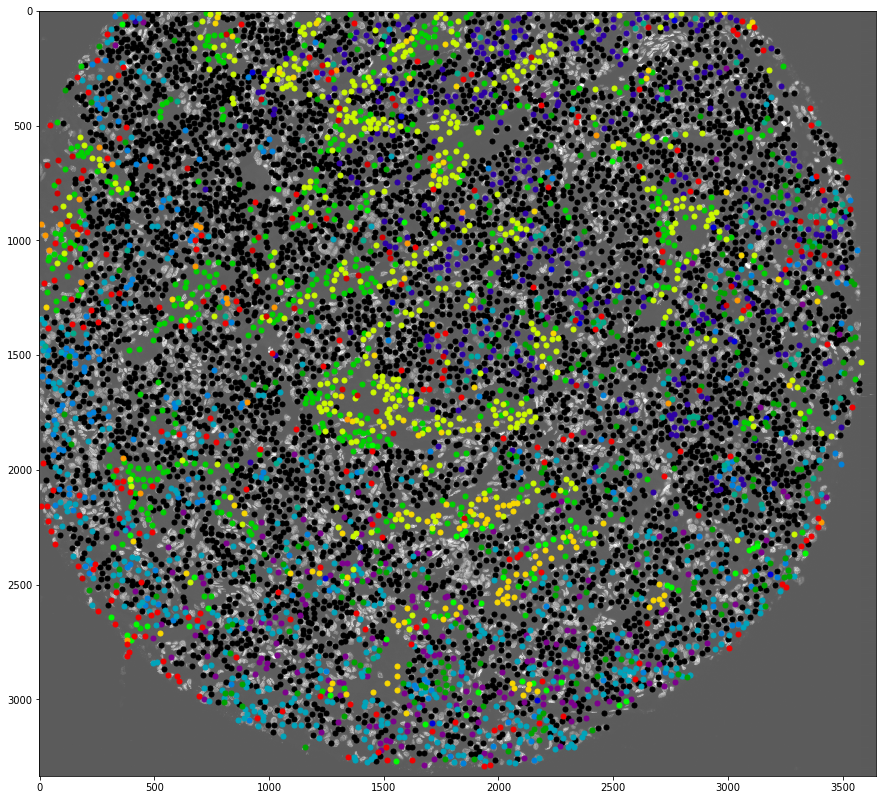

In [21]:
##%%%%%%%%%%%%% Function to Transform Data %%%%%%%%%%
def Raw2TransformData(rawdata, TransformMethod):
    # no transformation required by user - return the same values
    if TransformMethod == 'None':
        newdata = rawdata

    # Normalize raw data
    elif TransformMethod == 'Normalize':
        newdata = rawdata/max(rawdata)

    # Log the data then normalize
    elif TransformMethod == 'Log then Normalize':
        newdata = np.log2(rawdata)
        newdata = newdata/max(newdata)
    
    return newdata

# Unit test        
"""bm = 'COX2'
rawdata = NewDF[bm].values
TransformMethod = QualSettingsDict['ProcessingSettings']['BMs'][bm]['DataTransform']

test = Raw2TransformData(rawdata,TransformMethod)
test"""

#%%%%%%%%%%%%%%% Label Data based on Settings %%%%%%%%%%%%%%%%
# loop through each biomarker and individually label cells based on thresholds
# Initializing new labeled dataframe
LabelDF = []
LabelDF = NewDF.loc[:,('CellID','slide','region','epithelial',
                        'NominalPostion_X','NominalPosition_Y')]
# string for future Cell Type order - only relevant for the non-continous settings (threshold and k-means)
LabelCellTypeString = ''
LabelCellCols = []
ContLabelCellTypeString = ''
ContLabelCellCols = []


for bm in QualSettingsDict['ProcessingSettings']['BMs']:
    # ****&&&& Transform Data
    rawdata = NewDF[bm].values
    TransformMethod = QualSettingsDict['ProcessingSettings']['BMs'][bm]['DataTransform']

    newdata = Raw2TransformData(rawdata, TransformMethod)
        
    # ****Thresholding Labelling
    if QualSettingsDict['ProcessingSettings']['BMs'][bm]['LabelMethod'][0] == 'Hard Thresholding by Biomarker':
        LabelCellTypeString = LabelCellTypeString + bm + '_'
        LabelCellCols.append(bm+'_ThreshLabel')
                
        # Add Column of zeros in LabelDF
        LabelDF[(bm+'_ThreshLabel')] = 0
        # sort the inputs and remove duplicate threshold inputs
        vect = sorted(list(set(QualSettingsDict['ProcessingSettings']['BMs'][bm]['LabelMethod'][1])))
        #print(vect)
        for i, thresh in enumerate(vect):
            # if it is the first bin
            if i == 0:
                LabelDF[(bm+'_ThreshLabel')].iloc[[(NewDF[bm] < thresh)]] = i + 1
                prevthresh = thresh
            # middle bins:
            elif i > 0 & i < (len(vect)-1):
                LabelDF[(bm+'_ThreshLabel')].iloc[[((NewDF[bm] >= prevthresh) & 
                       (NewDF[bm] < thresh))]] = i + 1
                prevthresh = thresh
            # last bin
            elif i == (len(vect)-1):
                LabelDF[(bm+'_ThreshLabel')].iloc[[(NewDF[bm] >= thresh)]] = i + 1
        
    # ****K-Means by Biomarker
    elif QualSettingsDict['ProcessingSettings']['BMs'][bm]['LabelMethod'][0] == 'K-Means by Biomarker':
        LabelCellTypeString = LabelCellTypeString + bm + '_'
        LabelCellCols.append(bm+'_KmeansLabel')
        
        K = QualSettingsDict['ProcessingSettings']['BMs'][bm]['LabelMethod'][1][0]
        #print(K)
        # Label Column is continuous to start:
        k_model_n2 = KMeans(n_clusters = K, random_state=1).fit(newdata.reshape(-1,1))
        LabelDF[(bm+'_KmeansLabel')] = k_model_n2.labels_
    
    # ****K-Means Grouped Biomarker
    elif QualSettingsDict['ProcessingSettings']['BMs'][bm]['LabelMethod'][0] == 'K-Means Grouped Biomarker':
        LabelDF[(bm+'_ContVal')] = newdata
        ContLabelCellCols.append(bm+'_ContVal')
        ContLabelCellTypeString = ContLabelCellTypeString + bm + '_'

# removing last character of string (extra underscore)
LabelCellTypeString = LabelCellTypeString[:-1]        
ContLabelCellTypeString = ContLabelCellTypeString[:-1]

# ============= Organize Cell Type Dataframe with only Thresholding Method and K-means values ===============
if LabelCellTypeString != '':
    # Identify cell types
    CellTypeDF = LabelDF.loc[ :, (LabelCellCols)]
    CellTypesArray = np.unique(CellTypeDF.values, axis=0)

    # labelling each row as the cell type
    CTdata = np.zeros(len(CellTypeDF.iloc[:,0])).astype(int)
    for i in range(len(CellTypesArray)):
         CTdata[(CellTypeDF.values == CellTypesArray[i]).all(axis=1)] = i + 1

    CellTypeDF['CellType_KThesh'] = CTdata
    NewDF['CellType_KThesh'] = CTdata

    #%%%%%%%%%%%%%%%%%%%%% Display Cell Type Legend %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
    LegendDF = pd.DataFrame(data = CellTypesArray, columns = list(CellTypeDF.columns)[:-1])

    maxim = len(CellTypesArray)
    cmap_pie = plt.cm.get_cmap('nipy_spectral', maxim)

    ct_colors = []

    for n in range(0,maxim):
        ct_colors.append(cmap_pie(n))
        ct_colors[n] = "rgba" + str((ct_colors[n][0]*255, ct_colors[n][1]*255, ct_colors[n][2]*255, ct_colors[n][3]))    

    def highlightCell(x):

        y = pd.DataFrame('', index=x.index, columns = x.columns)
        for i in x.index:
            color = 'background-color: ' + ct_colors[i]
            y.iloc[i,-1] = color
        return y
    LegendDF['Color'] = '   '
    ColoredLegendDF = LegendDF.style.apply(highlightCell,axis=None)
    display(Markdown('## The following are the Cell Types found through the biomarker labelling analysis:'))
    display(ColoredLegendDF)

#%%%%%%%%%%%%%%%%%%%  %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%

# ====== Threshold Cell Naming ======
if LabelCellTypeString != '':

    #88888888 Pie Chart 8888888888888888
    # count how many of each type exists
    CTbreakdown = CellTypeDF['CellType_KThesh'].value_counts().sort_index().to_frame()
    labels = [('Cell Type ' + str(cname)) for cname in CTbreakdown.index.tolist()]
    values = CTbreakdown['CellType_KThesh']


    trace = go.Pie(labels = labels, values = values, marker = dict(colors = ct_colors), textinfo= 'none')

    display(Markdown('### Cell Type Breakdown of Threshold and K-Means Method:'))

    py.iplot([trace])
   

    ######################################################################################################
        ##############################################################################################
    ######################################################################################################


    #88888888888888   CORRECT PLOTTING TECHNIQUE VIA MATPLOT LIB    888888888888888
    
    #LABEL FIGURE
    display(Markdown('### Plotting:'))
    
    # Read image
    im_in = cv2.imread(DAPIfile.files[0], cv2.IMREAD_GRAYSCALE);

    # INITIALIZE FILEPATH AND NAME OF THE INPUT IMAGE TO SET UP OUTPUT FILE NAME
    image_path = DAPIfile.files[0]
    image_name = os.path.basename(image_path)
    outfile = "Visualization___" + os.path.splitext(image_name)[0] + ".png" #Naming convention for output?
    
    # redefining celltype DF
    coor_celltypeDF = pd.concat([LabelDF[["NominalPostion_X","NominalPosition_Y"]], CellTypeDF['CellType_KThesh']], axis=1)
    coor_celltypeDF_sorted = coor_celltypeDF.sort_values(by=["CellType_KThesh"])

    #PLOT IMAGE
    fig1 = plt.figure(figsize=(15,15))
    implot = plt.imshow(im_in, 'gray', alpha=0.65)
    ax1 = fig1.add_subplot(111)
    
    #SET UP COLORMAP
    number_of_plots=max(CellTypeDF['CellType_KThesh'])
    colormap = plt.cm.nipy_spectral #I suggest to use nipy_spectral, Set1, Paired
    ax1.set_prop_cycle('color',[colormap(i) for i in np.linspace(0, 1,number_of_plots)])
    
    #PLOT POINTS
    prevelem = 0
    for n in range(1, number_of_plots):
        nextelem = (coor_celltypeDF_sorted["CellType_KThesh"] == n).sum()+prevelem
        X = coor_celltypeDF_sorted["NominalPostion_X"][prevelem:nextelem]
        Y = coor_celltypeDF_sorted["NominalPosition_Y"][prevelem:nextelem]
        ax1.plot(Y,X, label = n, linewidth = 0.0, marker = 'o', markersize='5')
        prevelem=nextelem
    ax1.autoscale()

    #OUTPUT IMAGE TO DESIRED DIRECTORY
    fig1.savefig(outfile, bbox_inches='tight')
    
    #SHOW PLOT
    fig1.show()
    
    


    ######################################################################################################
        ##############################################################################################
    ######################################################################################################


    """# ====== Continuous Cell Naming Functions ======    
    # function to automatically assess optimal K in K-means
    def pickKmeansClusters(indata,minClus, highestNumCl):
        progressbar = widgets.FloatProgress(min = minClus, max=highestNumCl, 
                                            description = 'Assessing K:')
        display(progressbar)
        listOfMetric=[]
        metricDF = pd.DataFrame()
        index = []

        for clus in (range(minClus, (highestNumCl + 1))):
            kmeans_model = KMeans(n_clusters=clus, random_state=1).fit(indata)
            labels = kmeans_model.labels_
            listOfMetric.append(metrics.calinski_harabaz_score(indata, labels))
            index.append(clus)
            progressbar.value = clus

        indexMin=np.argmax(listOfMetric)

        numOfClus=minClus+indexMin

        metricDF['NumofClusts'] = index 
        metricDF['CalinskiHarabazScore'] = listOfMetric

        progressbar.close()
        return (numOfClus, metricDF)

    # ====== Continuous Cell Naming ======
    if ContLabelCellTypeString != '':
        display('______________________________________________________________')
        display(Markdown('# K-Means by Grouped Biomarkers with:'))
        # ----------- minClus and highestNumCl Widgets ------------------
        minClusWidg = widgets.BoundedIntText(
            description = 'Minimum number of clusters:',
            min  = 2,
            style = {'description_width':'initial'}
        )
        display(minClusWidg)
        maxClusWidg = widgets.BoundedIntText(
            description = 'Maximum number of clusters:',
            min  = 3,
            style = {'description_width':'initial'}
        )
        display(maxClusWidg)

        # Update button
        UpdateRegsToggle = widgets.Button(
            description = 'Launch Assessment',
            button_style = 'warning',
            disabled = False,
            value = True

        )


        # ---------- Identify Number of Clusters ------------
        def AssessKMeans(args):
            # Get range of K - even if user has the max larger than the min
            Krange = sorted([minClusWidg.value, maxClusWidg.value])
            display(Markdown('_______________________________________________'))
            display(Markdown(('#### Assessing possible K between K = ' + str(Krange[0]) + ' to K = ')+ str(Krange[1]) + ':'))

            ContCellTypeDF = LabelDF.loc[ :, ContLabelCellCols]



            NumofClus, metricDF = pickKmeansClusters(ContCellTypeDF.values, Krange[0], Krange[1])

            Trace = go.Scatter(
                x = metricDF['NumofClusts'],
                y = metricDF['CalinskiHarabazScore'],
                mode = 'lines+markers',
            )
            fig = dict(data = [Trace], layout=dict(
                title = 'Calinski Harabaz Score vs. Number of K-Means Clusters',
                xaxis = dict(title = 'Number of K-Means Clusters'),
                yaxis = dict(title = 'Calinski Harabaz Score')
            ))
            py.iplot(fig)

            display(Markdown('### Therefore the optimal K = ' + str(NumofClus)))


            # --------- Label each cell with chosen K-Means ---------------------
            Kmodel = KMeans(n_clusters = NumofClus, random_state = 1).fit(ContCellTypeDF.values)

            ContCellTypeDF['CellType_Cont'] = Kmodel.labels_
            NewDF['CellType_Cont'] = Kmodel.labels_

        display(UpdateRegsToggle)

        UpdateRegsToggle.on_click(AssessKMeans)





    #%%%%%%%%%%%%%%%%%%% EXPORTING DICT TO .XML %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%

    from dicttoxml import dicttoxml
    DictToXML_output = dicttoxml(QualSettingsDict, attr_type=False)



    # ====== DICT TO .TXT ======
    #WriteDictToTxt = open("dict.txt","w")
    #WriteDictToTxt.write( str(QualSettingsDict) )
    #WriteDictToTxt.close()

    # ====== .TXT TO .XML ======
    """
    
# Run next markdown cell
display(Javascript('IPython.notebook.execute_cell_range(IPython.notebook.get_selected_index(), IPython.notebook.get_selected_index()+1)'))


In [23]:
CellCluster_outputDF = pd.concat([LabelDF[["slide","region","NominalPostion_X","NominalPosition_Y"]], CellTypeDF['CellType_KThesh']], axis=1)
CellCluster_outputDF.to_csv('DataPoints_Clustering.csv')

display(Markdown('### Selected data points exported to output folder.'))
display(Markdown('## End of Program.'))

### Selected data points exported to output folder.

## End of Program.